# Import Data and Preprocessing

Data used here can be found in the following 2 website:
1. The 140k gan dataset can be found [here](https://www.kaggle.com/datasets/xhlulu/140k-real-and-fake-faces).
2. The 9k sd dataset can be found [here](https://github.com/tobecwb/stable-diffusion-face-dataset.git).

In [ ]:
!git clone https://github.com/tobecwb/stable-diffusion-face-dataset.git

Cloning into 'stable-diffusion-face-dataset'...
remote: Enumerating objects: 9040, done.
remote: Counting objects: 100% (3024/3024), done.
remote: Compressing objects: 100% (3017/3017), done.
remote: Total 9040 (delta 7), reused 3021 (delta 4), pack-reused 6016
Receiving objects: 100% (9040/9040), 3.02 GiB | 26.78 MiB/s, done.
Resolving deltas: 100% (7/7), done.
Updating files: 100% (9005/9005), done.


In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Base directory of the cloned dataset
base_dir = 'stable-diffusion-face-dataset'

# New base directory
new_base_dir = 'gan+sd(1.5,2.1,xl1.0)'
os.makedirs(new_base_dir, exist_ok=True)

sizes = ['512', '768', '1024']

for size in sizes:
    # Create train, val, test directories for each size
    for split in ['train', 'val', 'test']:
        os.makedirs(os.path.join(new_base_dir, split, 'fake'), exist_ok=True)

    # List all files in both man and woman folders for each size
    man_files = os.listdir(os.path.join(base_dir, size, 'man'))
    woman_files = os.listdir(os.path.join(base_dir, size, 'woman'))

    # Combine lists and shuffle, then split
    total_files = [os.path.join(size, 'man', f) for f in man_files] + [os.path.join(size, 'woman', f) for f in woman_files]

    # Split data into train (70%), validation (20%), and test (10%)
    train_files, test_files = train_test_split(total_files, test_size=0.3, random_state=42)
    val_files, test_files = train_test_split(test_files, test_size=0.333, random_state=42)

    # Function to move files
    def move_files(files, split):
        for file in files:
            original_path = os.path.join(base_dir, file)
            new_path = os.path.join(new_base_dir, split, 'fake', size + '_' + os.path.basename(file))
            shutil.copy(original_path, new_path)

    # Move files to the respective directories
    move_files(train_files, 'train')
    move_files(val_files, 'val')
    move_files(test_files, 'test')

print("Dataset organization complete.")


Dataset organization complete.


In [ ]:
# 检查一下每个directory一共有多少张图片

# New base directory
new_base_dir = 'gan+sd(1.5,2.1,xl1.0)'

# Count files in each of the train, val, test directories under 'fake'
def count_files(directory):
    return len(os.listdir(directory))

train_count = count_files(os.path.join(new_base_dir, 'train', 'fake'))
val_count = count_files(os.path.join(new_base_dir, 'val', 'fake'))
test_count = count_files(os.path.join(new_base_dir, 'test', 'fake'))

print(f"Total images in 'train/fake': {train_count}")
print(f"Total images in 'val/fake': {val_count}")
print(f"Total images in 'test/fake': {test_count}")


Total images in 'train/fake': 6300
Total images in 'val/fake': 1800
Total images in 'test/fake': 900


In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"applejin","key":"0b93924b947f72a219bb11234c07cc77"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d xhlulu/140k-real-and-fake-faces

Dataset URL: https://www.kaggle.com/datasets/xhlulu/140k-real-and-fake-faces
License(s): other
100% 3.75G/3.75G [01:36<00:00, 42.1MB/s]
100% 3.75G/3.75G [01:36<00:00, 41.9MB/s]


In [ ]:
!unzip 140k-real-and-fake-faces.zip

流式输出内容被截断，只能显示最后 5000 行内容。
  inflating: real_vs_fake/real-vs-fake/valid/real/34832.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34836.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34839.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34847.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34848.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34852.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34861.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34864.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34868.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34877.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34883.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34887.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34891.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34894.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34904.jpg  
  inflating: real_vs_fake/real-vs-fake/vali

In [ ]:
# Define base directories
source_dir = 'real_vs_fake/real-vs-fake'
target_dir = 'gan+sd(1.5,2.1,xl1.0)'

# Setup for easy mapping and processing
operations = [
    {'src': 'train/fake', 'dest': 'train/fake', 'count': 4200, 'label': 'gan'},
    {'src': 'train/real', 'dest': 'train/real', 'count': 10500, 'label': 'gan'},
    {'src': 'valid/fake', 'dest': 'val/fake', 'count': 1200, 'label': 'gan'},
    {'src': 'valid/real', 'dest': 'val/real', 'count': 3000, 'label': 'gan'},
    {'src': 'test/fake', 'dest': 'test/fake', 'count': 600, 'label': 'gan'},
    {'src': 'test/real', 'dest': 'test/real', 'count': 1500, 'label': 'gan'}
]

# Function to process each operation
for op in operations:
    src_path = os.path.join(source_dir, op['src'])
    dest_path = os.path.join(target_dir, op['dest'])
    os.makedirs(dest_path, exist_ok=True)  # Ensure destination directory exists

    # Get files and limit to the specified count
    files = sorted(os.listdir(src_path))[:op['count']]

    # Copy and rename files
    for file in files:
        src_file = os.path.join(src_path, file)
        dest_file = os.path.join(dest_path, f"{op['label']}_{file}")
        shutil.copy(src_file, dest_file)

    # Verify operation by counting files
    print(f"Files in {dest_path}: {len(os.listdir(dest_path))}")

print("Image transfer and renaming complete.")


Files in gan+sd(1.5,2.1,xl1.0)/train/fake: 10500
Files in gan+sd(1.5,2.1,xl1.0)/train/real: 10500
Files in gan+sd(1.5,2.1,xl1.0)/val/fake: 3000
Files in gan+sd(1.5,2.1,xl1.0)/val/real: 3000
Files in gan+sd(1.5,2.1,xl1.0)/test/fake: 1500
Files in gan+sd(1.5,2.1,xl1.0)/test/real: 1500
Image transfer and renaming complete.


In [ ]:
import os
import glob
import pandas as pd

main_path = './gan+sd(1.5,2.1,xl1.0)'

train_dir = os.path.join(main_path, 'train')
valid_dir = os.path.join(main_path, 'val')
test_dir = os.path.join(main_path, 'test')

images_df = {
    "folder":[],
    "image_path":[],
    "label":[]
}

for folder in os.listdir(main_path): #iterate on each train, valid and test folder
    for label in os.listdir(main_path + "/" + folder): #iterate on fake and real folders (labels)
        for img in glob.glob(main_path + "/" + folder + "/" + label + "/*.jpg"):
            images_df["folder"].append(folder)
            images_df["image_path"].append(img)
            images_df["label"].append(label)
images_df = pd.DataFrame(images_df)
images_df

,folder,image_path,label
0,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/512_woman_07...",fake
1,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/768_man_0106...",fake
2,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/768_woman_09...",fake
3,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/1024_woman_0...",fake
4,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/gan_1PCRGAOF...",fake
...,...,...,...
29995,val,"./gan+sd(1.5,2.1,xl1.0)/val/real/gan_03657.jpg",real
29996,val,"./gan+sd(1.5,2.1,xl1.0)/val/real/gan_12883.jpg",real
29997,val,"./gan+sd(1.5,2.1,xl1.0)/val/real/gan_19033.jpg",real
29998,val,"./gan+sd(1.5,2.1,xl1.0)/val/real/gan_15514.jpg",real


In [ ]:
real_grouped_df = images_df[images_df['label'] == "real"].groupby('folder')
fake_grouped_df = images_df[images_df['label'] == "fake"].groupby('folder')

import tensorflow as tf
import matplotlib.pyplot as plt
from keras.models import load_model
from keras.preprocessing import image
import seaborn as sns
from sklearn import metrics

image_train_gen = tf.keras.preprocessing.image.ImageDataGenerator(
                                  rescale=1./255.,
                                  horizontal_flip=True,
                                  )

image_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

In [ ]:
train_ds = image_train_gen.flow_from_directory(
    train_dir,
    target_size=(256, 256),
    batch_size=64,
    class_mode='binary',
)

valid_ds = image_gen.flow_from_directory(
    valid_dir,
    target_size=(256, 256),
    batch_size=64,
    class_mode='binary'
)

test_ds = image_gen.flow_from_directory(
    test_dir,
    target_size=(256, 256),
    batch_size=64,
    class_mode='binary',
    shuffle=False) #shuffle disabled

Found 21000 images belonging to 2 classes.
Found 6000 images belonging to 2 classes.
Found 3000 images belonging to 2 classes.


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

base_model = MobileNet(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

base_model.trainable = False

for layer in base_model.layers[-10:]: # unfreeze the last 10 layers
    layer.trainable = True

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)

# from tensorflow.keras.layers import Dropout
# x = Dropout(0.5)(x)  # add a dropout layer
predictions = Dense(1, activation='sigmoid')(x)

model = Model(inputs=base_model.input, outputs=predictions)

model.compile(optimizer=tf.keras.optimizers.Adam(lr=0.0001), # lower the learning rate
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
# Implement callbacks to prevent overfitting
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
    tf.keras.callbacks.ModelCheckpoint(filepath='model_best_weights.h5', monitor='val_loss', save_best_only=True)
]

# Fine-tune the model
history = model.fit(
    train_ds,
    epochs=5,  # You can adjust the number of epochs
    validation_data=valid_ds,
    callbacks=callbacks
)

# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(test_ds)
print(f"Test accuracy: {test_acc}, Test loss: {test_loss}")

Epoch 1/5
329/329 [==============================] - ETA: 0s - loss: 0.2687 - accuracy: 0.8900

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


329/329 [==============================] - 290s 854ms/step - loss: 0.2687 - accuracy: 0.8900 - val_loss: 2.8946 - val_accuracy: 0.5228
Epoch 2/5
329/329 [==============================] - 275s 836ms/step - loss: 0.1329 - accuracy: 0.9475 - val_loss: 0.3633 - val_accuracy: 0.8612
Epoch 3/5
329/329 [==============================] - 247s 752ms/step - loss: 0.0893 - accuracy: 0.9655 - val_loss: 0.7892 - val_accuracy: 0.7653
Epoch 4/5
329/329 [==============================] - 249s 757ms/step - loss: 0.0746 - accuracy: 0.9720 - val_loss: 2.0603 - val_accuracy: 0.7237
Epoch 5/5
47/47 [==============================] - 31s 618ms/step - loss: 0.4955 - accuracy: 0.8873
Test accuracy: 0.887333333492279, Test loss: 0.49545231461524963


In [ ]:
import os
import shutil
import numpy as np
import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator

# Base test directory
test_dir = 'gan+sd(1.5,2.1,xl1.0)/test'

# Define prefixes and their corresponding labels
prefixes = ['gan', '512', '768', '1024']
labels = ['GAN', 'SD1.5', 'SD2.1', 'SDXL1.0']

# Function to filter images based on prefix
def load_images_for_prefix(prefix, label):
    # Temporary directory to hold filtered images
    temp_dir = 'temp_test_folder'
    os.makedirs(temp_dir, exist_ok=True)

    # Loop through 'fake' and 'real' directories
    for subdir in ['fake', 'real']:
        source_dir = os.path.join(test_dir, subdir)
        dest_dir = os.path.join(temp_dir, subdir)
        os.makedirs(dest_dir, exist_ok=True)

        # Copy images with the specific prefix
        for filename in os.listdir(source_dir):
            if filename.startswith(prefix):
                shutil.copy(os.path.join(source_dir, filename), dest_dir)

    # Load these images using ImageDataGenerator
    image_gen = ImageDataGenerator(rescale=1./255.)
    data_generator = image_gen.flow_from_directory(
        temp_dir,
        target_size=(256, 256),
        batch_size=64,
        class_mode='binary',
        shuffle=False)

    # Evaluate the model on this dataset
    loss, accuracy = model.evaluate(data_generator)
    print(f"Test accuracy for {label}: {accuracy}, Test loss: {loss}")

    # Cleanup the temporary directory
    shutil.rmtree(temp_dir)

# Loop over each generator prefix and test
for prefix, label in zip(prefixes, labels):
    load_images_for_prefix(prefix, label)


Found 2100 images belonging to 2 classes.
33/33 [==============================] - 8s 256ms/step - loss: 0.7019 - accuracy: 0.8395
Test accuracy for GAN: 0.8395237922668457, Test loss: 0.7018918395042419
Found 300 images belonging to 2 classes.
5/5 [==============================] - 3s 684ms/step - loss: 0.0403 - accuracy: 0.9967
Test accuracy for SD1.5: 0.996666669845581, Test loss: 0.040333300828933716
Found 300 images belonging to 2 classes.
5/5 [==============================] - 8s 2s/step - loss: 5.8207e-04 - accuracy: 1.0000
Test accuracy for SD2.1: 1.0, Test loss: 0.0005820702644996345
Found 300 images belonging to 2 classes.
5/5 [==============================] - 11s 2s/step - loss: 3.6402e-04 - accuracy: 1.0000
Test accuracy for SDXL1.0: 1.0, Test loss: 0.0003640196518972516


# Test on the Stable Diffusion images generated by ourself (NO.1)

In [ ]:
files.upload()

Saving sd_test.zip to sd_test.zip


{'sd_test.zip': b'PK\x03\x04\x14\x00\x00\x00\x00\x004\x9b\xa3X\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00 \x00sd_test/UT\r\x00\x07ur5fur5fur5fux\x0b\x00\x01\x04\xf5\x01\x00\x00\x04\x14\x00\x00\x00PK\x03\x04\x14\x00\x08\x00\x08\x00\x90\x9b\xa3X\x00\x00\x00\x00\x00\x00\x00\x00\x04 \x00\x00\x11\x00 \x00sd_test/.DS_StoreUT\r\x00\x07!s5fsr5f!s5fux\x0b\x00\x01\x04\xf5\x01\x00\x00\x04\x14\x00\x00\x00\xedY\xcfk\x13A\x14~\x93F\xbb\xb1\xd6n\xd3F\x83zX\xccEh\xc0\xb6VK\x111\xddF\xb4xh\xe9\x96\x9a\x92\xd6\xb8\x9b\x9d\xa4K7;\xeb\xee\xa6\xb1-\x85\x9e\xf5\x0f\x10\xcf\xfe\x07\x8a\xe0U\xc1\xab\xa7\xe2U\xc1\x837\x11\xc1\x83 \xe8lv\xb6n\xd2\x1f \x1e\xacv>\x18\xbe\xd9\xfd\xe6\xcd\xcc\xdb\xc9\x9b\xe1M\x00\x00\xc9u}\x08 \r\x00\x02\x04,v\xc1\xae\x10X\xd9\x81\x18\xe3\x13\xb4 j\x0fZ\xc3\xb55\x93h\xf4\xf9\xc5\xee}qpppppp\xfce\xa0\x80\x84=\xce}\x0e\x0e\x8eC\x0c\x7f\x7f\x90\x18\xe7\x18o\x06\x8c\x98\x1ec\x1c\x8f\xd8\x88\x8c%\xc69\xc6\x9b\x01#\xd6.\xc68\xceX`,2\x96\x18\xe7\x18o\x06\xcc6-\xc4\x92\x0f\xc4

In [ ]:
!unzip sd_test.zip

Archive:  sd_test.zip
   creating: sd_test/
  inflating: sd_test/.DS_Store       
  inflating: __MACOSX/sd_test/._.DS_Store  
   creating: sd_test/real/
   creating: sd_test/fake/
  inflating: sd_test/real/5861714778830.jpg  
  inflating: __MACOSX/sd_test/real/._5861714778830.jpg  
  inflating: sd_test/fake/4144caafc6f8f0ee98bd1df3d23314eb.jpg  
  inflating: __MACOSX/sd_test/fake/._4144caafc6f8f0ee98bd1df3d23314eb.jpg  
  inflating: sd_test/fake/0a8e1d6306a2b536ae83cf6f8eb17048.jpg  
  inflating: __MACOSX/sd_test/fake/._0a8e1d6306a2b536ae83cf6f8eb17048.jpg  
  inflating: sd_test/fake/f8b68351b8e64bc8ae4215db9388fd66.jpg  
  inflating: __MACOSX/sd_test/fake/._f8b68351b8e64bc8ae4215db9388fd66.jpg  
  inflating: sd_test/fake/1edd3561b1fca09d2ffa17d8657d5f01.jpg  
  inflating: __MACOSX/sd_test/fake/._1edd3561b1fca09d2ffa17d8657d5f01.jpg  
  inflating: sd_test/fake/d53303a11d4e8757972bbcd10da4a68f.jpg  
  inflating: __MACOSX/sd_test/fake/._d53303a11d4e8757972bbcd10da4a68f.jpg  
  inflating:

In [ ]:
sd_test_dir = './sd_test'

images_df = {
    "image_path":[],
    "label":[]
}

for label in os.listdir(sd_test_dir): #iterate on fake and real folders (labels)
    for img in glob.glob(sd_test_dir + "/" + label + "/*.jpg"):
        images_df["image_path"].append(img)
        images_df["label"].append(label)
images_df = pd.DataFrame(images_df)
images_df

,image_path,label
0,./sd_test/fake/4144caafc6f8f0ee98bd1df3d23314e...,fake
1,./sd_test/fake/0a8e1d6306a2b536ae83cf6f8eb1704...,fake
2,./sd_test/fake/f8b68351b8e64bc8ae4215db9388fd6...,fake
3,./sd_test/fake/1edd3561b1fca09d2ffa17d8657d5f0...,fake
4,./sd_test/fake/c03d51bfb2003ef4737e73bad9a6561...,fake
5,./sd_test/fake/b0c8693dc0092463299c9a53e1340f7...,fake
6,./sd_test/fake/8ae85b927d8faf7799a6d2dfa451a2d...,fake
7,./sd_test/fake/30573f076b637b18a23c4fdf8f6c0e5...,fake
8,./sd_test/fake/d53303a11d4e8757972bbcd10da4a68...,fake
9,./sd_test/fake/38e0e99049591d4346ef795416bab5b...,fake


In [ ]:
image_train_gen = tf.keras.preprocessing.image.ImageDataGenerator(
                                  rescale=1./255.,
                                  horizontal_flip=True,
                                  )

image_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

In [ ]:
test_ds = image_gen.flow_from_directory(
    sd_test_dir,
    target_size=(256, 256),
    class_mode='binary',
    shuffle=False) #shuffle disabled

Found 11 images belonging to 2 classes.


In [ ]:
model.load_weights(filepath='model_best_weights.h5')
test_loss, test_acc = model.evaluate(test_ds)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_acc}")

1/1 [==============================] - 0s 495ms/step - loss: 0.0058 - accuracy: 1.0000
Test Loss: 0.005777757149189711, Test Accuracy: 1.0


# Test on the Stable Diffusion images generated by ourself (NO.2)

In [ ]:
files.upload()

Saving sd_test_2.zip to sd_test_2.zip


{'sd_test_2.zip': b'PK\x03\x04\x14\x00\x00\x00\x00\x004\x9b\xa3X\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00 \x00sd_test_2/UT\r\x00\x07ur5fur5f\xa5t5fux\x0b\x00\x01\x04\xf5\x01\x00\x00\x04\x14\x00\x00\x00PK\x03\x04\x14\x00\x08\x00\x08\x00i\x9c\xa3X\x00\x00\x00\x00\x00\x00\x00\x00\x04 \x00\x00\x13\x00 \x00sd_test_2/.DS_StoreUT\r\x00\x07\xb6t5f#s5f\xb6t5fux\x0b\x00\x01\x04\xf5\x01\x00\x00\x04\x14\x00\x00\x00\xedY\xcfO\x13A\x14~S\xaalE`)T\x1a\xf5\xb0\xb1\x17\x13\x9a\x08\x05!\xc4\x18K\xa9\xd1\xc6\x03\x84%XR\xb0\xeev\xa7e\xc3v\xa7\xeen\xa9@H8\xeb\x1f`<\xfb\'\x18\x13\xaf\x9ax51A\xaf\x92\xf8\x0f\x18\x13o&:\xdb\x9d\xc5m\xf9\x91\x18\x0f\xa0\xcc\x97L\xbe\xd9\xfd\xe6\xed\xcc\xdb\xd97\xd37\x05\x00\x94\xa9k#\x00q\x00\x10\xc0c\xb1\x0b\x0e\x84\xc0\xca>\x84\x18\xf7\xd0\x82\xa8=\xa8\r\xbb\xa6\x1aD\xa5\xd7\xaf\x0f~\x16\x07\x07\x07\x07\x07\x07\xc71\x03y$\x1c\xb2\xefspp\x9cb\xb8\xeb\x83\xc48\xcdx\xdbc\xc4\xf4\x10\xe3p\xc0Fd,1N3\xde\xf6\x18\xb1v!\xc6a\xc6\x02c\x91\xb1\xc48\xcdx\xdbc\xb6h!\x96| \x

In [ ]:
!unzip sd_test_2.zip

Archive:  sd_test_2.zip
   creating: sd_test_2/
  inflating: sd_test_2/.DS_Store     
  inflating: __MACOSX/sd_test_2/._.DS_Store  
   creating: sd_test_2/real/
   creating: sd_test_2/fake/
  inflating: sd_test_2/real/.DS_Store  
  inflating: __MACOSX/sd_test_2/real/._.DS_Store  
  inflating: sd_test_2/real/Ana_Palacio_0002.jpg  
  inflating: __MACOSX/sd_test_2/real/._Ana_Palacio_0002.jpg  
  inflating: sd_test_2/real/Salma_Hayek_0013.jpg  
  inflating: __MACOSX/sd_test_2/real/._Salma_Hayek_0013.jpg  
  inflating: sd_test_2/real/Yao_Ming_0003.jpg  
  inflating: __MACOSX/sd_test_2/real/._Yao_Ming_0003.jpg  
  inflating: sd_test_2/real/Pervez_Musharraf_0002.jpg  
  inflating: __MACOSX/sd_test_2/real/._Pervez_Musharraf_0002.jpg  
  inflating: sd_test_2/real/Kate_Hudson_0005.jpg  
  inflating: __MACOSX/sd_test_2/real/._Kate_Hudson_0005.jpg  
  inflating: sd_test_2/real/Richard_Virenque_0005.jpg  
  inflating: __MACOSX/sd_test_2/real/._Richard_Virenque_0005.jpg  
  inflating: sd_test_2/real

In [ ]:
sd_test_2_dir = './sd_test_2'

images_df = {
    "image_path":[],
    "label":[]
}

for label in os.listdir(sd_test_2_dir): #iterate on fake and real folders (labels)
    for img in glob.glob(sd_test_2_dir + "/" + label + "/*.jpg"):
        images_df["image_path"].append(img)
        images_df["label"].append(label)
images_df = pd.DataFrame(images_df)
images_df

,image_path,label
0,./sd_test_2/fake/4144caafc6f8f0ee98bd1df3d2331...,fake
1,./sd_test_2/fake/0a8e1d6306a2b536ae83cf6f8eb17...,fake
2,./sd_test_2/fake/f8b68351b8e64bc8ae4215db9388f...,fake
3,./sd_test_2/fake/1edd3561b1fca09d2ffa17d8657d5...,fake
4,./sd_test_2/fake/c03d51bfb2003ef4737e73bad9a65...,fake
5,./sd_test_2/fake/b0c8693dc0092463299c9a53e1340...,fake
6,./sd_test_2/fake/8ae85b927d8faf7799a6d2dfa451a...,fake
7,./sd_test_2/fake/30573f076b637b18a23c4fdf8f6c0...,fake
8,./sd_test_2/fake/d53303a11d4e8757972bbcd10da4a...,fake
9,./sd_test_2/fake/38e0e99049591d4346ef795416bab...,fake


In [ ]:
image_train_gen = tf.keras.preprocessing.image.ImageDataGenerator(
                                  rescale=1./255.,
                                  horizontal_flip=True,
                                  )

image_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

In [ ]:
test_ds = image_gen.flow_from_directory(
    sd_test_2_dir,
    target_size=(256, 256),
    class_mode='binary',
    shuffle=False) #shuffle disabled

Found 20 images belonging to 2 classes.


In [ ]:
model.load_weights(filepath='model_best_weights.h5')
test_loss, test_acc = model.evaluate(test_ds)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_acc}")

1/1 [==============================] - 0s 197ms/step - loss: 0.0038 - accuracy: 1.0000
Test Loss: 0.003797943238168955, Test Accuracy: 1.0


# gradCAM

In [ ]:
from IPython.display import Image, display
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import keras

In [ ]:
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.utils.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.utils.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [ ]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.5):
    # Load the original image
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    display(Image(cam_path))


In [ ]:
# Get the names of all layers in the model.
for idx in range(len(model.layers)):
  print(model.get_layer(index = idx).name)

input_1
conv1
conv1_bn
conv1_relu
conv_dw_1
conv_dw_1_bn
conv_dw_1_relu
conv_pw_1
conv_pw_1_bn
conv_pw_1_relu
conv_pad_2
conv_dw_2
conv_dw_2_bn
conv_dw_2_relu
conv_pw_2
conv_pw_2_bn
conv_pw_2_relu
conv_dw_3
conv_dw_3_bn
conv_dw_3_relu
conv_pw_3
conv_pw_3_bn
conv_pw_3_relu
conv_pad_4
conv_dw_4
conv_dw_4_bn
conv_dw_4_relu
conv_pw_4
conv_pw_4_bn
conv_pw_4_relu
conv_dw_5
conv_dw_5_bn
conv_dw_5_relu
conv_pw_5
conv_pw_5_bn
conv_pw_5_relu
conv_pad_6
conv_dw_6
conv_dw_6_bn
conv_dw_6_relu
conv_pw_6
conv_pw_6_bn
conv_pw_6_relu
conv_dw_7
conv_dw_7_bn
conv_dw_7_relu
conv_pw_7
conv_pw_7_bn
conv_pw_7_relu
conv_dw_8
conv_dw_8_bn
conv_dw_8_relu
conv_pw_8
conv_pw_8_bn
conv_pw_8_relu
conv_dw_9
conv_dw_9_bn
conv_dw_9_relu
conv_pw_9
conv_pw_9_bn
conv_pw_9_relu
conv_dw_10
conv_dw_10_bn
conv_dw_10_relu
conv_pw_10
conv_pw_10_bn
conv_pw_10_relu
conv_dw_11
conv_dw_11_bn
conv_dw_11_relu
conv_pw_11
conv_pw_11_bn
conv_pw_11_relu
conv_pad_12
conv_dw_12
conv_dw_12_bn
conv_dw_12_relu
conv_pw_12
conv_pw_12_bn
conv_pw

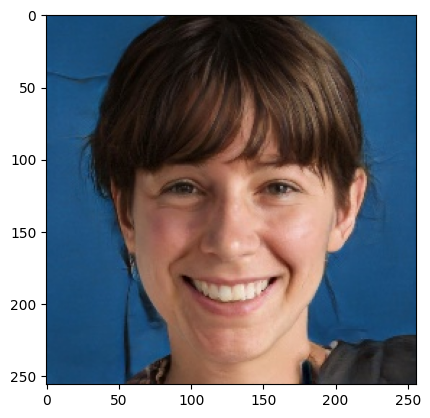

In [ ]:
import numpy as np

img_size = (256, 256)


last_conv_layer_name = "dense_1"

img_path = "/content/real_vs_fake/real-vs-fake/test/fake/02NUKFGPSJ.jpg"

test_image = tf.keras.preprocessing.image.load_img(img_path, target_size=(256, 256, 3))
plt.imshow(test_image)

img = tf.keras.preprocessing.image.img_to_array(test_image)
img = np.expand_dims(img, axis=0)
img = img/255.

1/1 [==============================] - 0s 21ms/step
Predicted: [[-5.370525]]


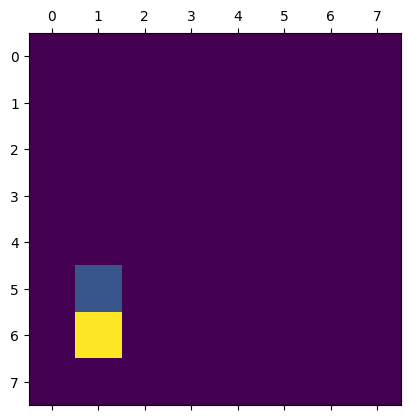

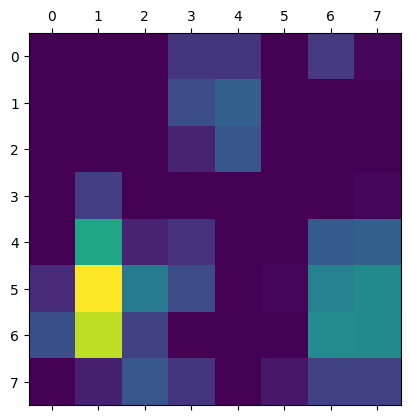

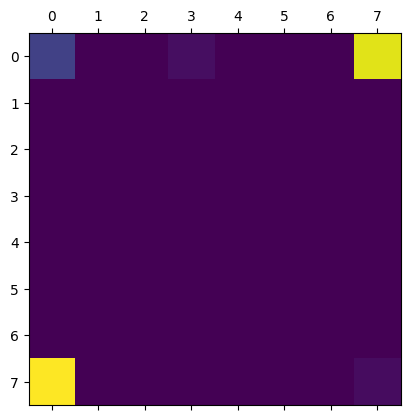

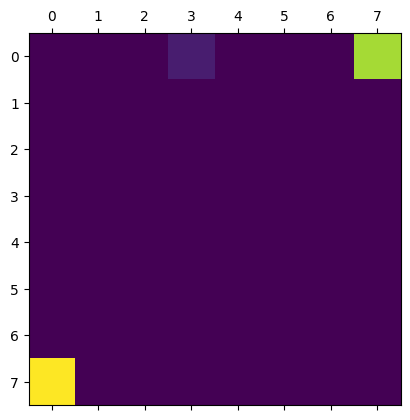

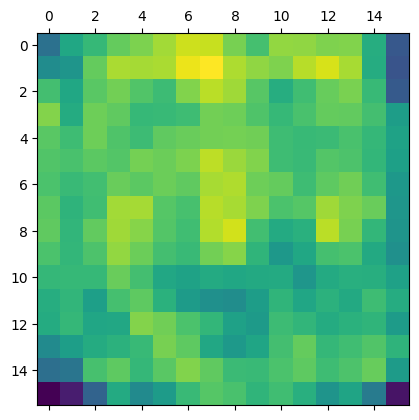

In [ ]:
# Remove last layer's softmax
# model.layers[-1].activation = None

# Print what the top predicted class is
model.load_weights(filepath='')
preds = model.predict(img)
print("Predicted:", preds)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img, model, "conv_pw_13")
heatmap_2 = make_gradcam_heatmap(img, model, "conv_dw_13")
heatmap_3 = make_gradcam_heatmap(img, model, "conv_pw_12")
heatmap_4 = make_gradcam_heatmap(img, model, "conv_dw_12")
heatmap_5 = make_gradcam_heatmap(img, model, "conv_pw_11")

# Display heatmap
plt.matshow(heatmap)
plt.matshow(heatmap_2)
plt.matshow(heatmap_3)
plt.matshow(heatmap_4)
plt.matshow(heatmap_5)
plt.show()

In [ ]:

save_and_display_gradcam(img_path, heatmap)
save_and_display_gradcam(img_path, heatmap_2)
save_and_display_gradcam(img_path, heatmap_3)
save_and_display_gradcam(img_path, heatmap_4)
save_and_display_gradcam(img_path, heatmap_5)

# gradCAM (Average)

In [ ]:
import cv2
def get_processed_img(img_path):
  test_image = tf.keras.preprocessing.image.load_img(img_path, target_size=(256, 256, 3))
  img = tf.keras.preprocessing.image.img_to_array(test_image)
  img = np.expand_dims(img, axis=0)
  img = img/255.
  return img

def get_fused_heatmap(img_path, model):

  test_image = tf.keras.preprocessing.image.load_img(img_path, target_size=(256, 256, 3))
  img = tf.keras.preprocessing.image.img_to_array(test_image)
  img = np.expand_dims(img, axis=0)
  img = img/255.

  layer_names = []
  for idx in range(len(model.layers)):
    name = model.get_layer(index = idx).name
    if "input" not in name and "bn" not in name and "relu" not in name and "dense" not in name and "pad" not in name and "pool" not in name and "conv1" not in name:
      layer_names.append(name)

  heatmaps = []
  for layer_name in layer_names:
    this_heatmap = make_gradcam_heatmap(img, model, layer_name)
    # print(this_heatmap.shape)
    this_heatmap = cv2.resize(this_heatmap, (img.shape[1], img.shape[2]))
    # print(this_heatmap.shape)
    heatmaps.append(this_heatmap)

  fused_heatmap = np.mean(heatmaps, axis = 0)

  return fused_heatmap

In [ ]:
from google.colab import files
files.upload()


Saving model_best_weights (sd+gan).h5 to model_best_weights (sd+gan).h5


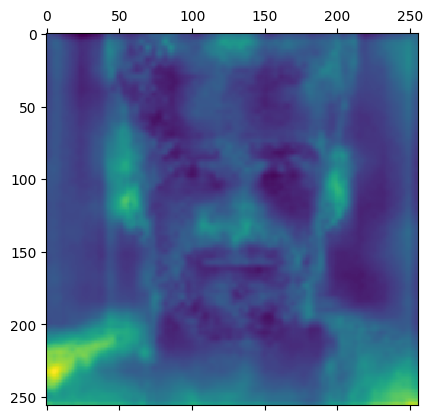

In [ ]:
import numpy as np
img_path = "/content/gan+sd(1.5,2.1,xl1.0)/train/fake/1024_men_0002.jpg"
model.load_weights(filepath='model_best_weights.h5')
fused_heatmap1 = get_fused_heatmap(img_path, model)
plt.matshow(fused_heatmap1)

<ipython-input-15-10cb15bf560a>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


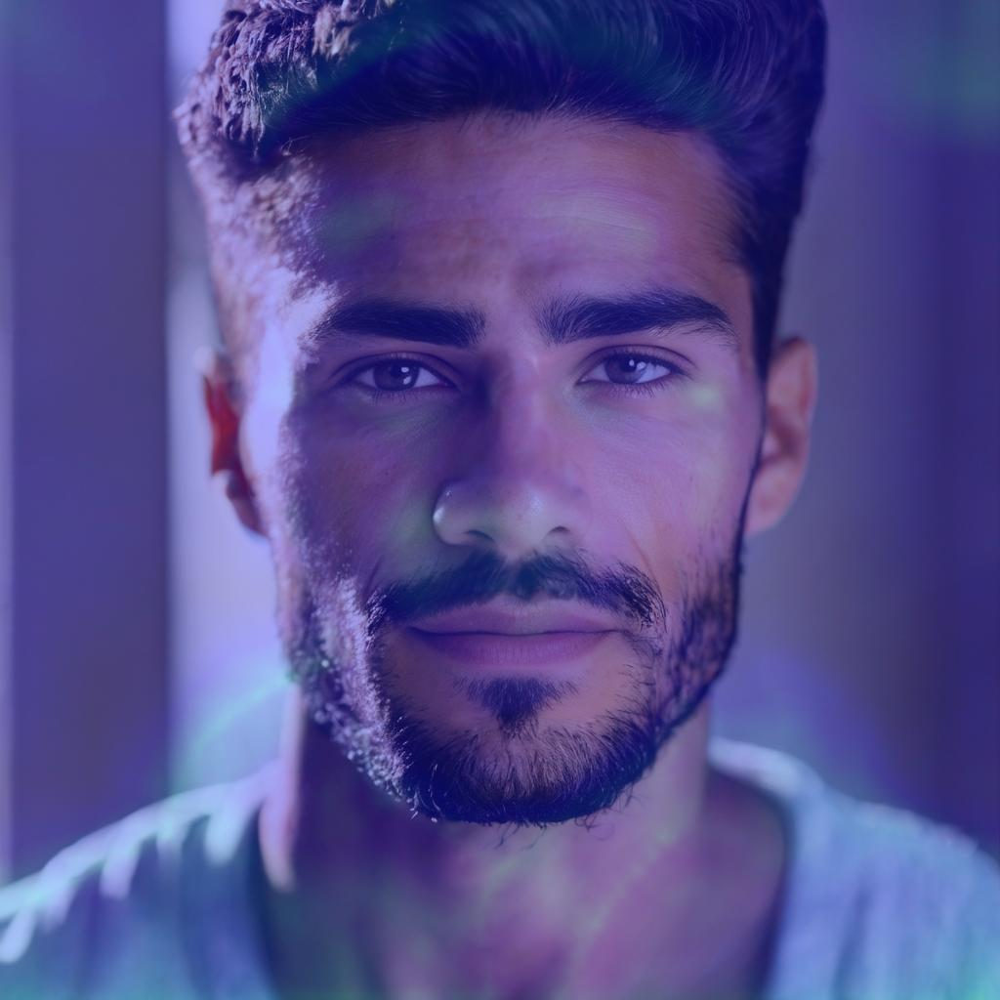

In [ ]:
save_and_display_gradcam(img_path, fused_heatmap2)

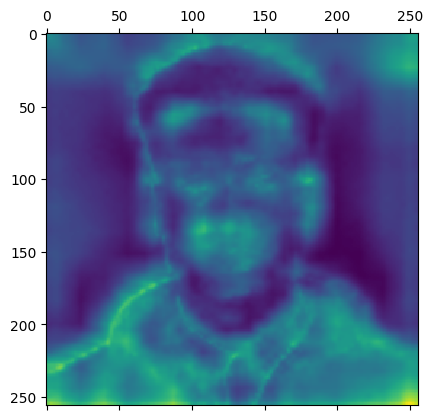

In [ ]:
img_path2 = "/content/gan+sd(1.5,2.1,xl1.0)/test/fake/1024_men_0249.jpg"
fused_heatmap2 = get_fused_heatmap(img_path2, model)
plt.matshow(fused_heatmap2)

<ipython-input-15-10cb15bf560a>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


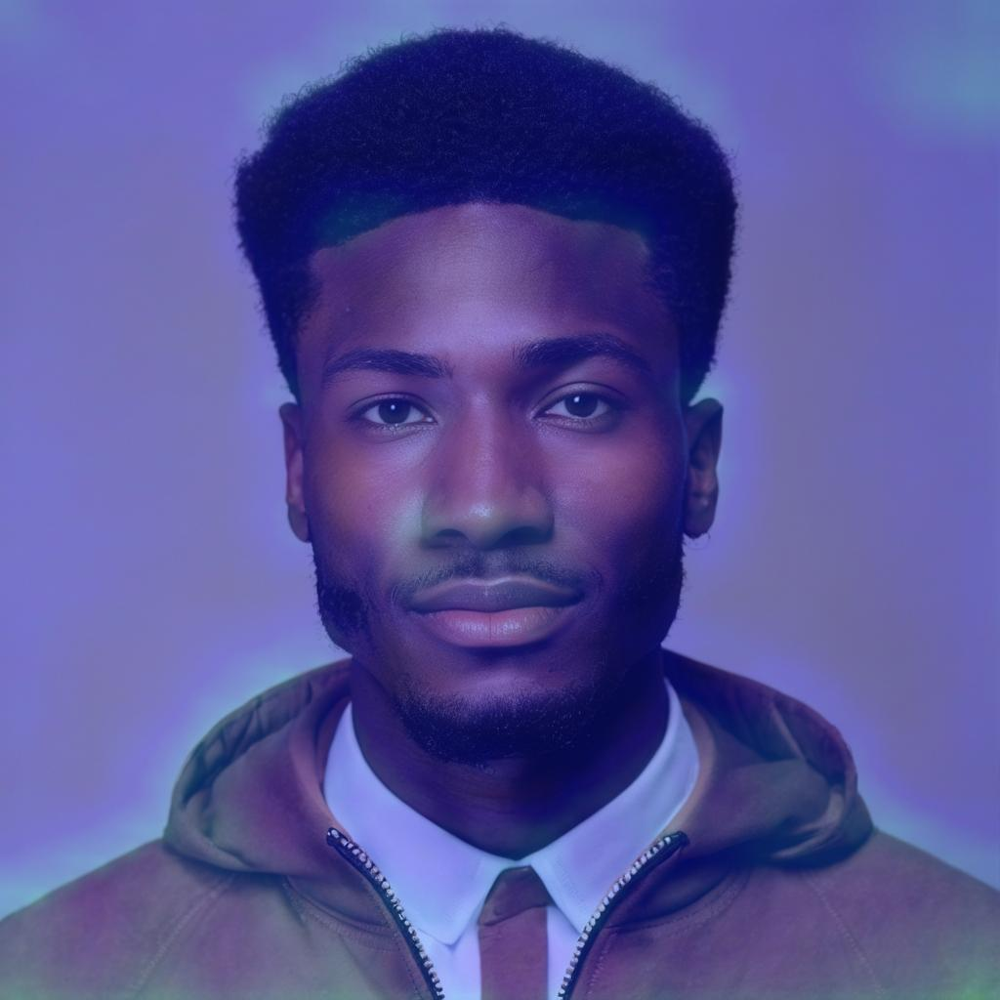

In [ ]:
save_and_display_gradcam(img_path2, fused_heatmap2)

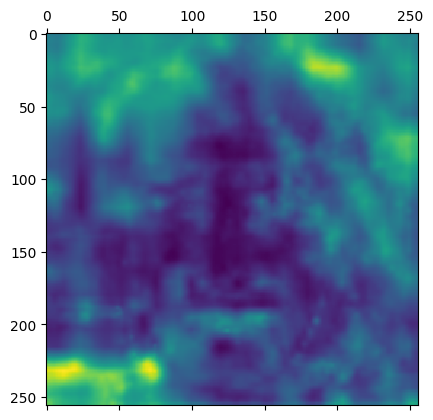

In [ ]:
# grad-cam for real images
img_path_real1 = "/content/gan+sd(1.5,2.1,xl1.0)/test/real/gan_00001.jpg"
fused_heatmap3 = get_fused_heatmap(img_path_real1, model)
plt.matshow(fused_heatmap3)

<ipython-input-15-10cb15bf560a>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


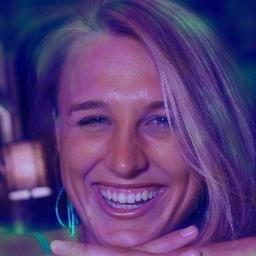

In [ ]:
save_and_display_gradcam(img_path_real1, fused_heatmap3)

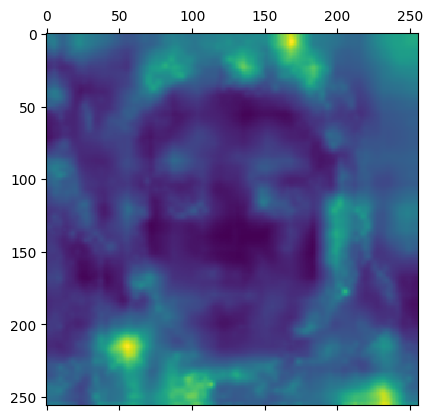

In [ ]:
img_path_real2 = "/content/gan+sd(1.5,2.1,xl1.0)/test/real/gan_00004.jpg"
fused_heatmap4= get_fused_heatmap(img_path_real2, model)
plt.matshow(fused_heatmap4)

<ipython-input-15-10cb15bf560a>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


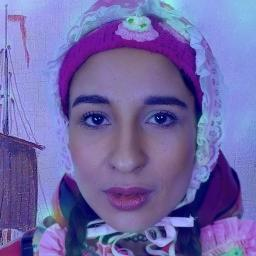

In [ ]:
save_and_display_gradcam(img_path_real2, fused_heatmap4)

## check fp and fn ##

In [ ]:
model.load_weights(filepath = 'model_best_weights.h5')
prediction_result_ontest = model.predict(test_ds)

47/47 [==============================] - 28s 544ms/step


In [ ]:
prediction_result_ontest

array([[2.4259498e-06],
       [3.2951530e-09],
       [8.8941049e-11],
       ...,
       [9.9993718e-01],
       [9.9892187e-01],
       [9.9823916e-01]], dtype=float32)

In [ ]:
prediction_result_ontest_binary = np.where(prediction_result_ontest > 0.5, 1, 0)
prediction_result_ontest_binary

array([[0],
       [0],
       [0],
       ...,
       [1],
       [1],
       [1]])

In [ ]:
images_df

,folder,image_path,label
0,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/512_woman_07...",fake
1,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/768_man_0106...",fake
2,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/768_woman_09...",fake
3,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/1024_woman_0...",fake
4,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/gan_1PCRGAOF...",fake
...,...,...,...
29995,val,"./gan+sd(1.5,2.1,xl1.0)/val/real/gan_03657.jpg",real
29996,val,"./gan+sd(1.5,2.1,xl1.0)/val/real/gan_12883.jpg",real
29997,val,"./gan+sd(1.5,2.1,xl1.0)/val/real/gan_19033.jpg",real
29998,val,"./gan+sd(1.5,2.1,xl1.0)/val/real/gan_15514.jpg",real


In [ ]:
test_df = images_df[images_df["folder"] == "test"]

In [ ]:
test_df_shuffled = test_df.sample(frac=1).iloc[:500]
test_df_shuffled

,folder,image_path,label
2034,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_07723.jpg",real
945,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/gan_0SE9DOTY...",fake
26,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/512_man_1180...",fake
639,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/768_man_0926...",fake
125,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/1024_woman_0...",fake
...,...,...,...
2365,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_00434.jpg",real
1884,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_08913.jpg",real
124,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/512_woman_13...",fake
2756,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_01046.jpg",real


In [ ]:
pred_results = []

for i in range(len(test_df_shuffled)):

  img_path = test_df_shuffled.iloc[i]["image_path"]
  img = get_processed_img(img_path)
  pred_results.append(model.predict(img))

pred_results = np.array(pred_results)
pred_results_binary = np.where(pred_results > 0.5, 1, 0)
pred_results_binary

1/1 [==============================] - 0s 21ms/step


array([[[1]],

       [[0]],

       [[0]],

       [[0]],

       [[0]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[0]],

       [[1]],

       [[1]],

       [[0]],

       [[1]],

       [[1]],

       [[0]],

       [[0]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[0]],

       [[1]],

       [[1]],

       [[0]],

       [[1]],

       [[1]],

       [[0]],

       [[1]],

       [[0]],

       [[1]],

       [[1]],

       [[0]],

       [[0]],

       [[0]],

       [[0]],

       [[1]],

       [[1]],

       [[1]],

       [[1]],

       [[0]],

       [[0]],

       [[0]],

       [[0]],

       [[0]],

       [[0]],

       [[1]],

       [[0]],

       [[1]],

       [[0]],

       [[0]],

       [[0]],

       [[0]],

       [[0]],

       [[0]],

       [[1]],

       [[0]],

       [[1]],

       [[1]],

       [[0]],

       [[1]],

       [[0]],

       [[1]],

       [[1]],

       [[1

In [ ]:
pred_results_binary = pred_results_binary.reshape(-1, 1)

In [ ]:
test_df_shuffled

,folder,image_path,label
2034,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_07723.jpg",real
945,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/gan_0SE9DOTY...",fake
26,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/512_man_1180...",fake
639,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/768_man_0926...",fake
125,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/1024_woman_0...",fake
...,...,...,...
2365,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_00434.jpg",real
1884,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_08913.jpg",real
124,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/512_woman_13...",fake
2756,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_01046.jpg",real


In [ ]:

test_df_shuffled["pred_result"] = pred_results_binary

test_df_shuffled["pred_result"][test_df_shuffled["pred_result"] == 0] = "fake"
test_df_shuffled["pred_result"][test_df_shuffled["pred_result"] == 1] = "real"
test_df_shuffled

<ipython-input-36-82b7ac8412b6>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df_shuffled["pred_result"][test_df_shuffled["pred_result"] == 0] = "fake"


,folder,image_path,label,pred_result
2034,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_07723.jpg",real,real
945,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/gan_0SE9DOTY...",fake,fake
26,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/512_man_1180...",fake,fake
639,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/768_man_0926...",fake,fake
125,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/1024_woman_0...",fake,fake
...,...,...,...,...
2365,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_00434.jpg",real,real
1884,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_08913.jpg",real,real
124,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/512_woman_13...",fake,fake
2756,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_01046.jpg",real,real


In [ ]:
test_df_FN = test_df_shuffled[(test_df_shuffled["pred_result"] == "fake") & (test_df_shuffled["label"] == "real")]
test_df_FN

,folder,image_path,label,pred_result
1842,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_08809.jpg",real,fake
2875,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_05166.jpg",real,fake
1909,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_02882.jpg",real,fake
1631,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_05328.jpg",real,fake
2933,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_07077.jpg",real,fake
2650,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_07471.jpg",real,fake
2596,test,"./gan+sd(1.5,2.1,xl1.0)/test/real/gan_06512.jpg",real,fake


In [ ]:
test_df_FP = test_df_shuffled[(test_df_shuffled["pred_result"] == "real") & (test_df_shuffled["label"] == "fake")]
test_df_FP

,folder,image_path,label,pred_result
250,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/gan_1ILY1BV0...",fake,real
903,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/gan_1N5TR23I...",fake,real
535,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/gan_1XQBJKT7...",fake,real
1081,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/gan_1RU1HB72...",fake,real
220,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/gan_10BWYEIH...",fake,real
1308,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/gan_04PV48K8...",fake,real
330,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/gan_1S1IFMMT...",fake,real
438,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/gan_0HOLAABT...",fake,real
448,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/gan_025AJ3S2...",fake,real
1427,test,"./gan+sd(1.5,2.1,xl1.0)/test/fake/gan_0DVYA7FY...",fake,real


<ipython-input-15-10cb15bf560a>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


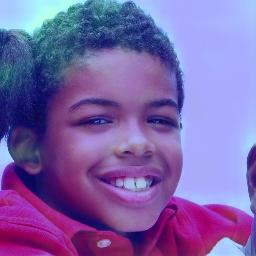

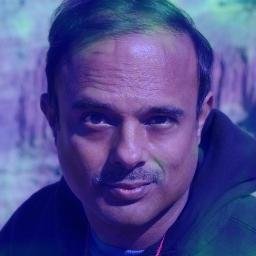

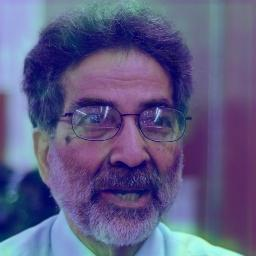

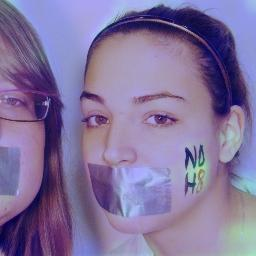

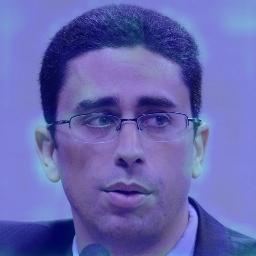

...

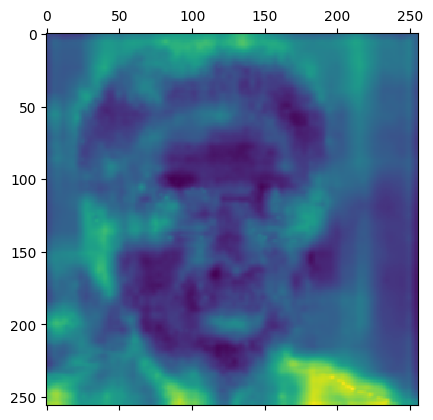

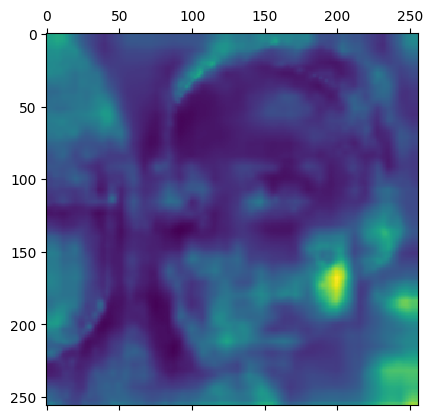

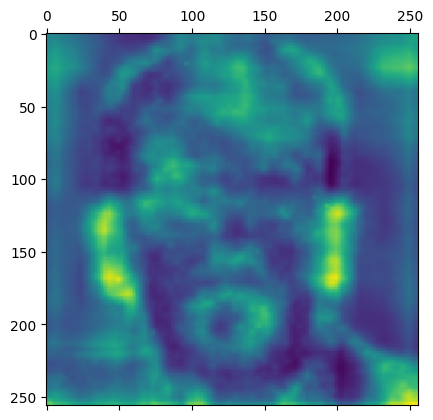

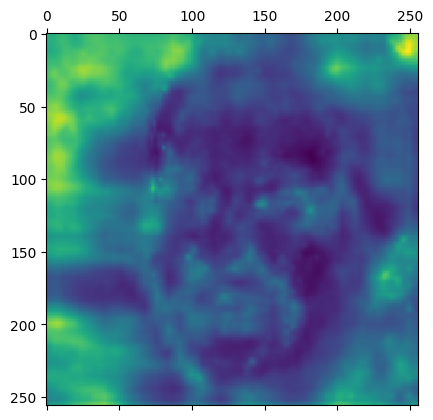

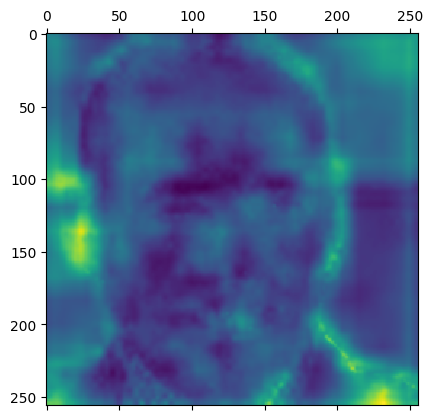

In [ ]:
## FN examples
for i in range(len(test_df_FN)):
  img_fn_path1 = test_df_FN.iloc[i]["image_path"]
  # img_fn_path2 = test_df_FN.iloc[1]["image_path"]
  fused_heatmap_fn1 = get_fused_heatmap(img_fn_path1, model)
  plt.matshow(fused_heatmap_fn1)
  save_and_display_gradcam(img_fn_path1, fused_heatmap_fn1)

<ipython-input-15-10cb15bf560a>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


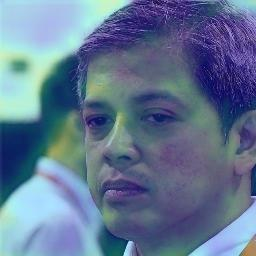

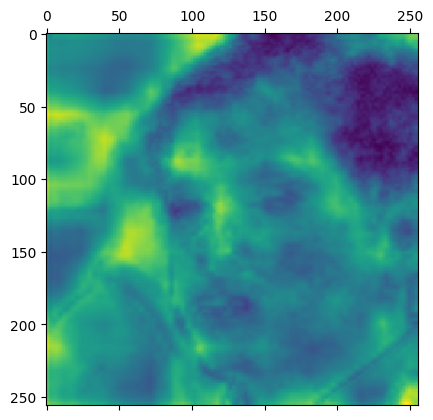

In [ ]:
img_fn_path2 = test_df_FN.iloc[1]["image_path"]
fused_heatmap_fn2 = get_fused_heatmap(img_fn_path2, model)
plt.matshow(fused_heatmap_fn2)
save_and_display_gradcam(img_fn_path2, fused_heatmap_fn2)

<ipython-input-15-10cb15bf560a>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


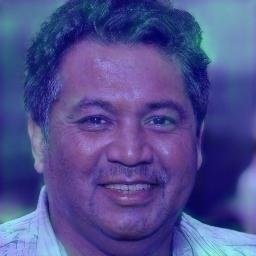

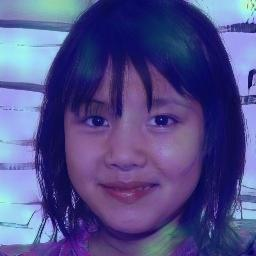

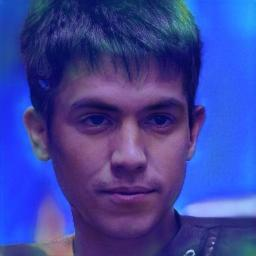

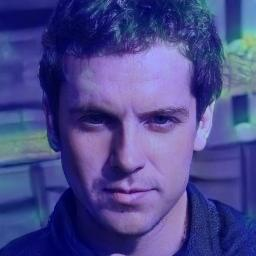

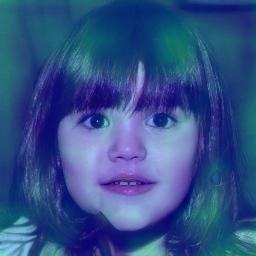

...

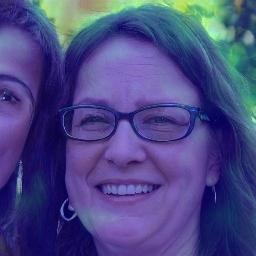

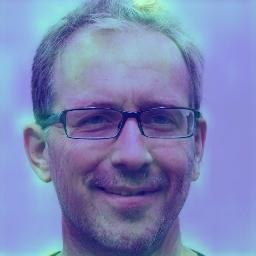

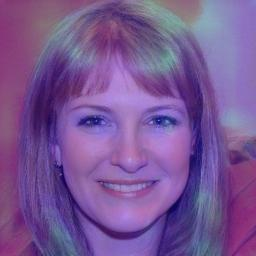

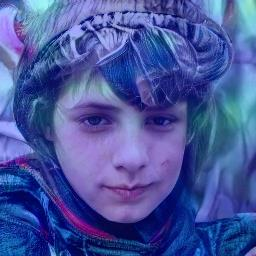

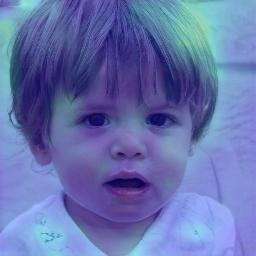

<ipython-input-42-cfb970f4f990>:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.matshow(fused_heatmap_fp1)


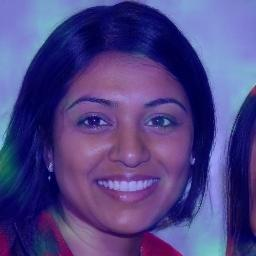

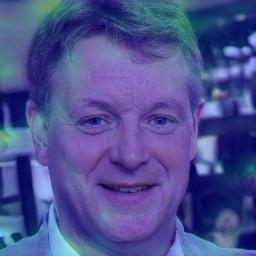

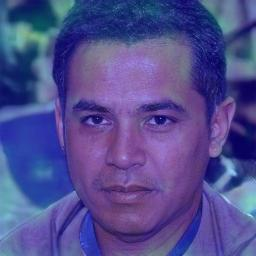

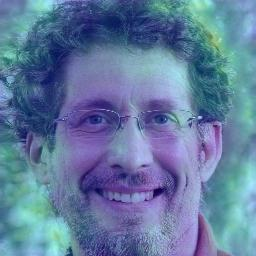

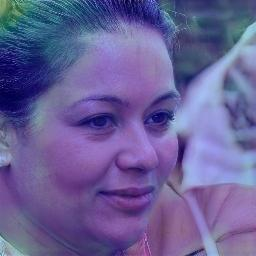

...

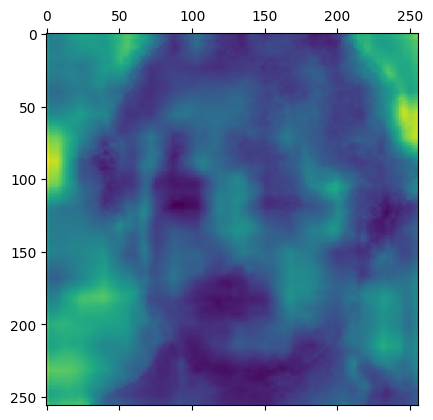

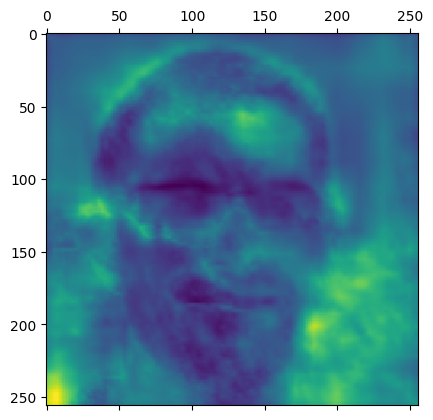

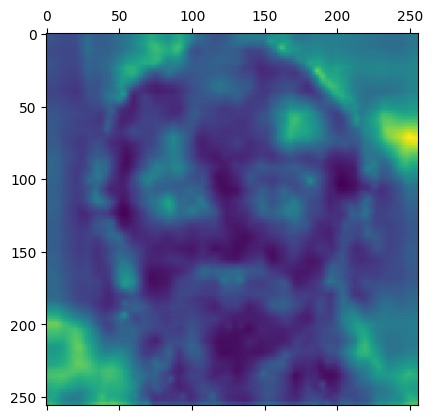

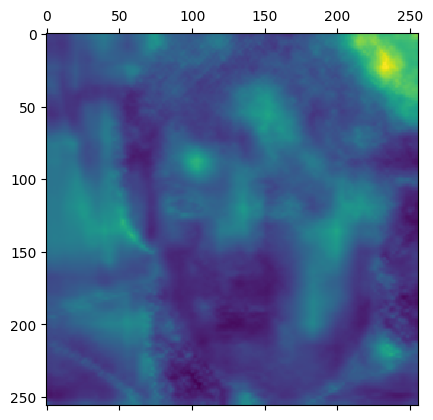

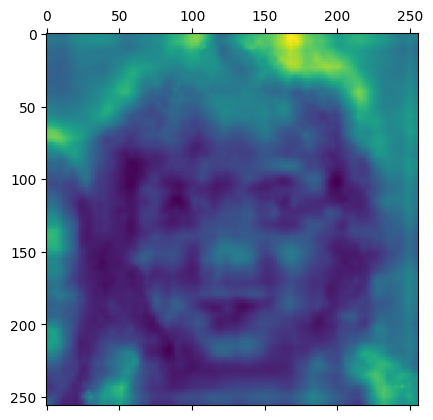

In [ ]:
## FP example
for i in range(len(test_df_FP)):
  img_fp_path1 = test_df_FP.iloc[i]["image_path"]
  fused_heatmap_fp1 = get_fused_heatmap(img_fp_path1, model)
  plt.matshow(fused_heatmap_fp1)
  save_and_display_gradcam(img_fp_path1, fused_heatmap_fp1)

In [ ]:
from google.colab import files
files.upload()

Saving model_best_weights (sd+gan).h5 to model_best_weights (sd+gan).h5


<ipython-input-7-10cb15bf560a>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = cm.get_cmap("jet")


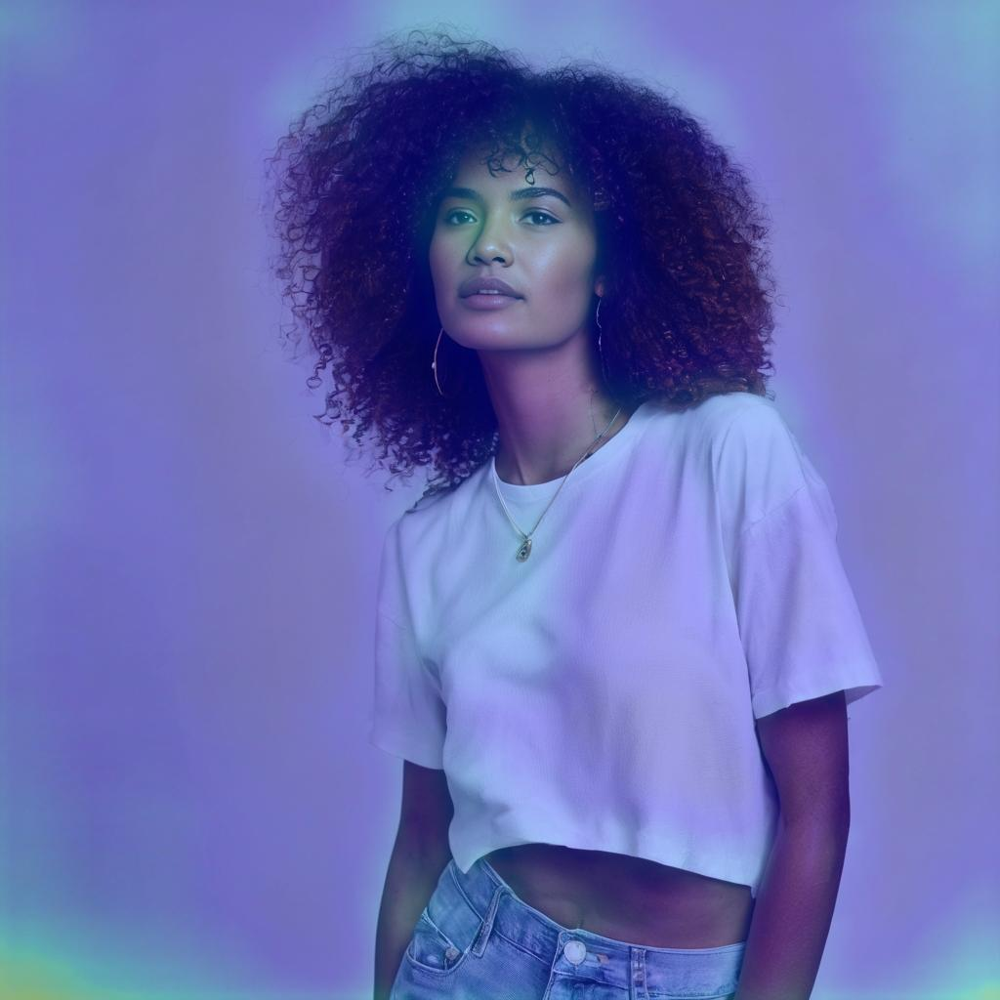

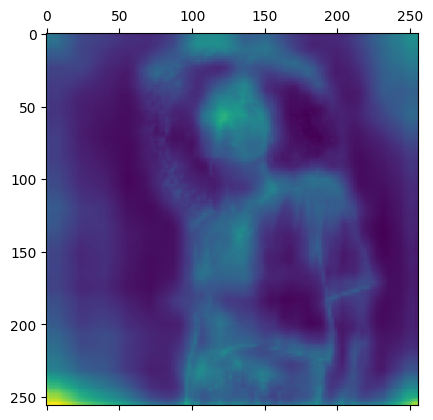

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
model.load_weights(filepath='model_best_weights.h5')
img_path = '/content/stable-diffusion-face-dataset/1024/woman/woman_0001.jpg'
fused_heatmap_fp1 = get_fused_heatmap(img_path, model)
plt.matshow(fused_heatmap_fp1)
save_and_display_gradcam(img_path, fused_heatmap_fp1)